In [1]:
import warnings
warnings.filterwarnings('ignore')

# Dependencies and Setup
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import os
import folium

from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime
import seaborn as sns
from sklearn.cluster import KMeans
import dtale # data Frame visualization
import datetime   # handle date times
import re         # regular expression package

In [2]:
# Check if data has been pickled and if so load pickle
if os.path.exists('data/txDF.pkl') :
    txDF=pd.read_pickle('data/txDF.pkl',compression='gzip')
    tx_metro_cities_df = pd.read_pickle('data/tx_metro_cities.pkl',compression='gzip')    
    full_df = pd.read_pickle('data/FullDF.pkl',compression='gzip')    
else:
# pickle only the attributes we are interested in, and compress
# pickle is much faster to load / smaller than csv
    full_df = pd.read_csv('data/US_Accidents_Dec19.csv',encoding='utf-8')
    columns_of_interest=[
        'ID','Severity','Start_Time','End_Time','Start_Lat', 'Start_Lng', 'City', 
        'County', 'State','Zipcode', 'Country','Visibility(mi)', 
        'Weather_Condition','Precipitation(in)','Sunrise_Sunset','Civil_Twilight'
    ]
    condition=full_df['State'] =='TX'
    txDF=full_df[condition][columns_of_interest]
    txDF['Counter']=1
    #create df for selected cities 
    tx_metro_cities =  ['Austin', 'Round Rock', 'Cedar Park',
                 'San Marcos', 'Georgetown', 'Pflugerville',
                 'Hutto', 'Buda', 'Kyle', 'Leander',
                 'Dallas', 'Fort Worth', 'Arlington', 
                 'Plano','Garland', 'Irving', 'McKinney', 
                 'Frisco','Denton','Richardson', 'Allen','El Paso',
                 'Houston', 'The Woodlands', 'Sugar Land',
                 'Baytown', 'Conroe','San Antonio', 'New Braunfels', 
                 'Schertz', 'Seguin']
    condition = txDF['City'].isin(tx_metro_cities)
    
    tx_metro_cities_df = txDF[condition]    
    txDF.to_pickle("data/txDF.pkl",compression='gzip')
    tx_metro_cities_df.to_pickle("data/tx_metro_cities.pkl",compression='gzip')
    full_df.to_pickle("data/FullDF.pkl",compression='gzip')

In [3]:
# code fron fast ai
# Date Feature Engineering
# will split data colum in to corresponding 'Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear'
def add_datepart(df, fldname, drop=True,time=False):
    fld = df[fldname]
    attributes = ['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear']
    if time: attributes = attributes + ['Hour', 'Minute', 'Second']
    #, 'Is_month_end', 'Is_month_start', 'Is_quarter_end', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']
    if not np.issubdtype(fld.dtype, np.datetime64):
        df[fldname] = fld = pd.to_datetime(fld, infer_datetime_format=True)
    targ_pre = re.sub('[Dd]ate$', '', fldname)
    for n in attributes:
        df[targ_pre+n] = getattr(fld.dt,n.lower())
    df[targ_pre+'Elapsed'] = fld.astype(np.int64) // 10**9
    if drop: df.drop(fldname, axis=1, inplace=True)
        
def dow(df):
    days=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
    return days[df]
        


In [4]:
add_datepart(tx_metro_cities_df,'Start_Time',False,True )
tx_metro_cities_df['Start_TimeDayofweek'] =tx_metro_cities_df['Start_TimeDayofweek'].apply(dow)


In [5]:
def plot_map1(df,LatLong, city=None):
    accident_map = folium.Map(location=LatLong, 
                           tiles = "OpenStreetMap",                              
                           zoom_start = 7)
    if city != None:
        data_heatmap = df[df["City"] == city]
    else:
        data_heatmap = df.copy()
    data_heatmap = data_heatmap[['Start_Lat','Start_Lng']]
    data_heatmap = [[row['Start_Lat'],row['Start_Lng']] for index, row in data_heatmap.iterrows()]
    HeatMap(data_heatmap, radius=15).add_to(accident_map)
    return accident_map

In [6]:
plot_map1(txDF,[30.2672,-97.7431])

# Year we are interested in

In [7]:
year = 2018
weekdays = ["Monday","Tuesday","Wednesday","Thursday","Friday"]
weekenddays =["Saturday","Sunday"]
condition = (tx_metro_cities_df['Start_TimeYear'] == year)

# Weekday Accidents Heatmap

In [8]:
condition = (tx_metro_cities_df['Start_TimeYear'] == year)  & (tx_metro_cities_df['Start_TimeDayofweek'].isin(weekdays))
plot_map1(tx_metro_cities_df[condition],[30.2672,-97.7431])

# Weekend Accidents Heatmap

In [9]:
condition = (tx_metro_cities_df['Start_TimeYear'] == 2018)  & (tx_metro_cities_df['Start_TimeDayofweek'].isin(weekenddays))
plot_map1(tx_metro_cities_df[condition],[30.2672,-97.7431])

In [10]:
def plot_heatmapWithTime(df,LatLong, city=None):
    accident_map = folium.Map(location=LatLong, 
#                           tiles = "Stamen Toner",
                           tiles = "OpenStreetMap",                              
                           zoom_start = 10)
    if city != None:
        data_heatmap = df[df["City"] == city]
    else:
        data_heatmap = df.copy()

    daylist = []
    for day in data_heatmap.Start_TimeDayofyear.sort_values().unique():
        daylist.append(data_heatmap.loc[data_heatmap.Start_TimeDayofyear == day, ['Start_Lat','Start_Lng']].groupby(['Start_Lat', 'Start_Lng']).sum().reset_index().values.tolist())   
    print(len(daylist))
    HeatMapWithTime(daylist, auto_play=True, radius=10, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'},
                   min_opacity=0.4, max_opacity=0.6, use_local_extrema=False).add_to(accident_map)
   

    return accident_map

In [11]:
condition = (tx_metro_cities_df['Start_TimeYear'] == year)   & (tx_metro_cities_df['City'] == 'Austin')
data_heatmap = tx_metro_cities_df[condition]
plot_heatmapWithTime(tx_metro_cities_df[condition],[30.2672,-97.7431])

360


# Austin Fatality Map

In [12]:
ausFatalityDF=pd.read_pickle('data/ausFatalityDF.pkl',compression='gzip')


In [13]:
def plot_FatalityMap(df,data_heatmap,LatLong, city=None):
    accident_map = folium.Map(location=LatLong, 
                           tiles = "OpenStreetMap",                              
                           zoom_start = 10)
    for lat,lan,name in zip(df['y_coord'],df['x_coord'],df['type']): 
        folium.Marker(location=[lat,lan],popup = name ,
                      icon= folium.Icon(color='red',icon = 'ambulance',prefix='fa')
                     ).add_to(accident_map)  
        
    data_heatmap = data_heatmap[['Start_Lat','Start_Lng']]
    data_heatmap = [[row['Start_Lat'],row['Start_Lng']] for index, row in data_heatmap.iterrows()]
    HeatMap(data_heatmap, radius=15).add_to(accident_map)
        

    return accident_map


In [14]:
condition = (tx_metro_cities_df['Start_TimeYear'] == year)   & (tx_metro_cities_df['City'] == 'Austin')
data_heatmap = tx_metro_cities_df[condition]

plot_FatalityMap(ausFatalityDF,data_heatmap,[30.2672,-97.7431])

# Cluster Analysis

(16103, 3)


<function matplotlib.pyplot.show(*args, **kw)>

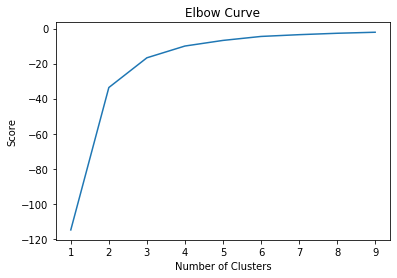

In [15]:
condition = (tx_metro_cities_df['Start_TimeYear'] == year) & (tx_metro_cities_df['City'] == 'Austin') 
austinDF = tx_metro_cities_df[condition]
austin_cluster=austinDF[["ID","Start_Lat", "Start_Lng"]]

#creating a variable that only has what we need: id, long, lat
print(austin_cluster.shape)
#elbow method to validate the number of clusters 
K_clusters = range(1,10)
kmeans=[KMeans(n_clusters=i)for i in K_clusters]
Y_axis=austin_cluster[["Start_Lat"]]
X_axis=austin_cluster[["Start_Lng"]]

score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
#visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel("Score")
plt.title("Elbow Curve")
plt.show



In [16]:
#from above Elbow curve, we see that we only need 3 clusters
#determined where the graph begins to level off slowly 
kmeans=KMeans(n_clusters = 3, init = "k-means++")
#compute k-means clustering
kmeans.fit(austin_cluster[austin_cluster.columns[1:3]])
austin_cluster["Cluster_Label"]=kmeans.fit_predict(austin_cluster[austin_cluster.columns[1:3]])
#coordinates of cluster centers
centers = kmeans.cluster_centers_
#labels for each point
labels=kmeans.predict(austin_cluster[austin_cluster.columns[1:3]])
austin_cluster.head(20)
austin_cluster.shape

(16103, 4)

In [17]:
def plot_ClusterMap(df,LatLong, city=None):
    accident_map = folium.Map(location=LatLong, 
                           tiles = "OpenStreetMap",                              
                           zoom_start = 10)
    colors = ['purple', 'lightblue', 'orange', 'green','magenta']
    for lat,lan,Cluster_Label in zip(df['Start_Lat'],df['Start_Lng'],df['Cluster_Label']): 
        folium.Marker(location=[lat,lan],popup = Cluster_Label,alpha=0.5,
                      icon= folium.Icon(color=colors[Cluster_Label],icon = 'car',prefix='fa')
                     ).add_to(accident_map) 
                      

    return accident_map
plot_ClusterMap(austin_cluster.sample(500),[30.2672,-97.7431])

In [18]:
austin_cluster.groupby("Cluster_Label")['ID'].count()

Cluster_Label
0    6716
1    4371
2    5016
Name: ID, dtype: int64